In [1]:
import os
from typing import Dict

import numpy as np
import pandas as pd
import plotly.offline as py
from matplotlib import pyplot as plt

from simple_portfolio.utils import process_profitchart_data
from simple_portfolio.bollinger import BollingerBands
from simple_portfolio.portfolio import Portfolio

In [2]:
py.init_notebook_mode(connected=True)

In [3]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [12, 9]

In [4]:
dolfut_1 = pd.read_csv('data/dados_dolfut/DOLFUT_1min.csv', sep=';', encoding='latin1', dtype=str)
indfut_1 = pd.read_csv('data/dados_indfut/INDFUT_1min.csv', sep=';', encoding='latin1', dtype=str)

dolfut_1 = process_profitchart_data(dolfut_1)
indfut_1 = process_profitchart_data(indfut_1)

In [5]:
dolfut_1.head()

,,open,high,low,close,volume,quantity
datetime,asset,,,,,,
2018-10-11 17:59:00,DOLFUT,3858.832,3858.832,3858.832,3858.832,947375.0,5
2018-10-15 09:00:00,DOLFUT,3831.338,3832.865,3829.811,3831.338,189994625.0,1010
2018-10-15 09:01:00,DOLFUT,3831.338,3838.975,3830.320,3836.939,417024250.0,2215
2018-10-15 09:02:00,DOLFUT,3836.430,3838.975,3833.375,3836.430,137518000.0,730
2018-10-15 09:03:00,DOLFUT,3836.939,3838.975,3835.920,3835.920,120586250.0,640


## Bollinger Bands
The formulas for constructing the bands is, typically:

$$TP = \frac{(High + Low + Close)}{3}$$
$$BB_{upper} = MA(TP, n) + m * \sigma[TP, n]$$
$$BB_{lower} = MA(TP, n) - m * \sigma[TP, n]$$

where

$BB =$ Bollinger Band

$MA(X, k) =$ Moving Average of signal X over last k periods

$\sigma[X, k] =$ Standard Deviation of signal X over last k periods

$n =$ number of periods to consider

$m =$ number of standard deviations to offset the bands by

In [6]:
bands_dol = BollingerBands(dolfut_1, 13, 2)
bands_bova = BollingerBands(indfut_1, 17, 2)

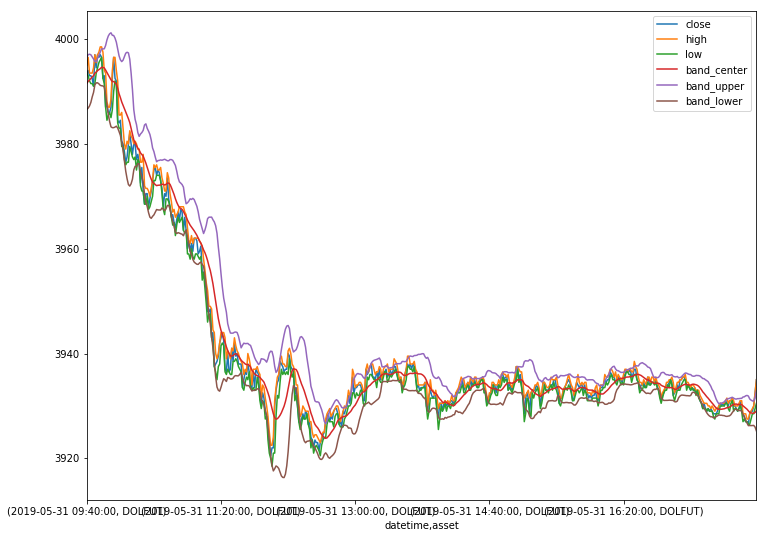

In [7]:
bands_dol.quotes[['close', 'high', 'low', 'band_center', 'band_upper', 'band_lower']].iloc[-500:].plot()

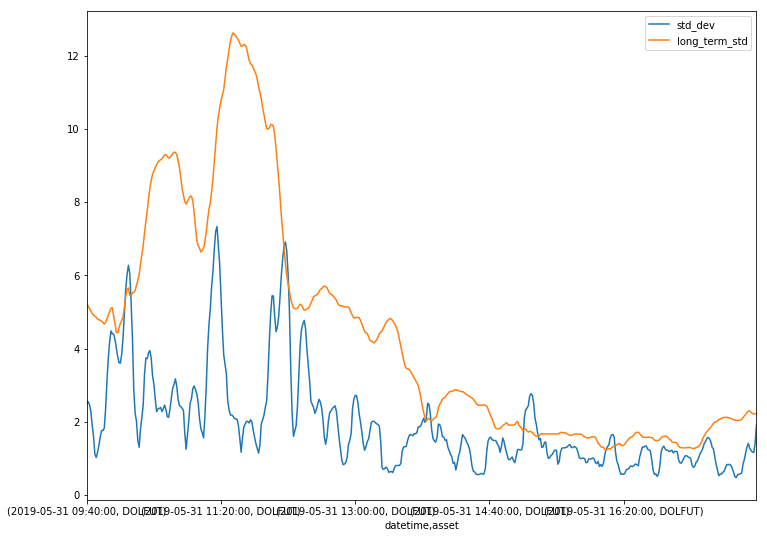

In [8]:
bands_dol.quotes[['std_dev', 'long_term_std']].iloc[-500:].plot()

In [9]:
bands_dol.plot_candlesticks('wtvman')